In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import plotly.graph_objects as go
import plotly.express as px
import missingno
from sklearn.preprocessing import scale
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
%matplotlib inline
warnings.simplefilter("ignore")
sns.set_style("whitegrid")

In [2]:
df = pd.read_csv('C:/Users/ranja/Downloads/IMDb Movies India.csv/IMDb Movies India.csv')
df.head()

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
0,,NaN,NaN,Drama,NaN,NaN,J.S. Randhawa,Manmauji,Birbal,Rajendra Bhatia
1,#Gadhvi (He thought he was Gandhi),|-2019|,109 min,Drama,7.0,8,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid
2,#Homecoming,-2021,90 min,"Drama, Musical",NaN,NaN,Soumyajit Majumdar,Sayani Gupta,Plabita Borthakur,Roy Angana
3,#Yaaram,-2019,110 min,"Comedy, Romance",4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
4,...And Once Again,-2010,105 min,Drama,NaN,NaN,Amol Palekar,Rajat Kapoor,Rituparna Sengupta,Antara Mali


In [3]:
df.shape

(15509, 10)

<Axes: >

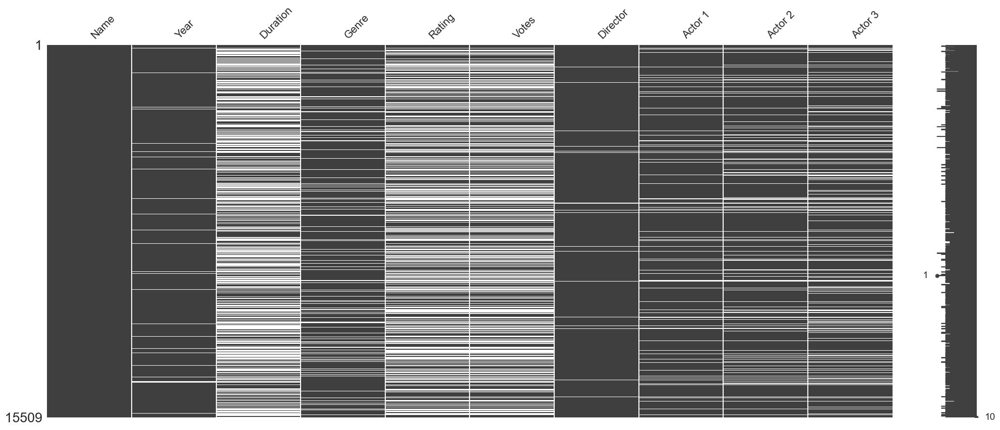

In [4]:
missingno.matrix(df)

In [5]:
def dataoveriew(df, message):
    print(f'{message}:\n')
    print("Rows:", df.shape[0])
    print("\nNumber of features:", df.shape[1])
    print("\nFeatures:")
    print(df.columns.tolist())
    print("\nMissing values:", df.isnull().sum().values.sum())
    print("\nUnique values:")
    print(df.nunique())
dataoveriew(df, 'Overiew of the training dataset')

Overiew of the training dataset:

Rows: 15509

Number of features: 10

Features:
['Name', 'Year', 'Duration', 'Genre', 'Rating', 'Votes', 'Director', 'Actor 1', 'Actor 2', 'Actor 3']

Missing values: 33523

Unique values:
Name        13838
Year          103
Duration      182
Genre         485
Rating         84
Votes        2034
Director     5938
Actor 1      4718
Actor 2      4891
Actor 3      4820
dtype: int64


In [6]:
year = []
for y in df.Year:
    if type(y) == float:
        year.append(np.nan)
    else:
        year.append(int(str(y)[1:5]))
df["Year"] = year
df.head()

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
0,,NaN,NaN,Drama,NaN,NaN,J.S. Randhawa,Manmauji,Birbal,Rajendra Bhatia
1,#Gadhvi (He thought he was Gandhi),-201.0,109 min,Drama,7.0,8,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid
2,#Homecoming,2021.0,90 min,"Drama, Musical",NaN,NaN,Soumyajit Majumdar,Sayani Gupta,Plabita Borthakur,Roy Angana
3,#Yaaram,2019.0,110 min,"Comedy, Romance",4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
4,...And Once Again,2010.0,105 min,Drama,NaN,NaN,Amol Palekar,Rajat Kapoor,Rituparna Sengupta,Antara Mali


In [7]:
duration = []
for d in df.Duration:
    if type(d) == float:
        duration.append(np.nan)
    else:
        duration.append(int(str(d).split(" ")[0]))
df["Duration"] = duration
df.head()

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
0,,NaN,NaN,Drama,NaN,NaN,J.S. Randhawa,Manmauji,Birbal,Rajendra Bhatia
1,#Gadhvi (He thought he was Gandhi),-201.0,109.0,Drama,7.0,8,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid
2,#Homecoming,2021.0,90.0,"Drama, Musical",NaN,NaN,Soumyajit Majumdar,Sayani Gupta,Plabita Borthakur,Roy Angana
3,#Yaaram,2019.0,110.0,"Comedy, Romance",4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
4,...And Once Again,2010.0,105.0,Drama,NaN,NaN,Amol Palekar,Rajat Kapoor,Rituparna Sengupta,Antara Mali


In [8]:
df["Votes"]=df["Votes"].replace("$5.16M", 516)
df["Votes"] = pd.to_numeric(df['Votes'].str.replace(',',''))
df.head()

,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
0,,NaN,NaN,Drama,NaN,NaN,J.S. Randhawa,Manmauji,Birbal,Rajendra Bhatia
1,#Gadhvi (He thought he was Gandhi),-201.0,109.0,Drama,7.0,8.0,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid
2,#Homecoming,2021.0,90.0,"Drama, Musical",NaN,NaN,Soumyajit Majumdar,Sayani Gupta,Plabita Borthakur,Roy Angana
3,#Yaaram,2019.0,110.0,"Comedy, Romance",4.4,35.0,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
4,...And Once Again,2010.0,105.0,Drama,NaN,NaN,Amol Palekar,Rajat Kapoor,Rituparna Sengupta,Antara Mali


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15509 entries, 0 to 15508
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Name      15509 non-null  object 
 1   Year      14981 non-null  float64
 2   Duration  7240 non-null   float64
 3   Genre     13632 non-null  object 
 4   Rating    7919 non-null   float64
 5   Votes     7919 non-null   float64
 6   Director  14984 non-null  object 
 7   Actor 1   13892 non-null  object 
 8   Actor 2   13125 non-null  object 
 9   Actor 3   12365 non-null  object 
dtypes: float64(4), object(6)
memory usage: 1.2+ MB


In [10]:
df.describe()

,Year,Duration,Rating,Votes
count,14981.000000,7240.000000,7919.000000,7919.000000
mean,1986.864028,128.126519,5.841621,1938.520394
std,31.072556,28.912724,1.381777,11602.415952
min,-201.000000,2.000000,1.100000,5.000000
25%,1968.000000,110.000000,4.900000,16.000000
50%,1991.000000,131.000000,6.000000,55.000000
75%,2009.000000,147.000000,6.800000,404.000000
max,2022.000000,321.000000,10.000000,591417.000000


In [11]:
directors = df["Director"].value_counts()
directors.head(5)

Jayant Desai       58
Kanti Shah         57
Babubhai Mistry    50
Mahesh Bhatt       48
Master Bhagwan     47
Name: Director, dtype: int64

In [12]:
df.isnull().sum()

Name           0
Year         528
Duration    8269
Genre       1877
Rating      7590
Votes       7590
Director     525
Actor 1     1617
Actor 2     2384
Actor 3     3144
dtype: int64

In [13]:
#printing Total null Values for the column Year and Genre
print('Null Values in Year Column',df['Year'].isnull().sum())
print('Null Values in Genre Column',df['Genre'].isnull().sum())

Null Values in Year Column 528
Null Values in Genre Column 1877


In [14]:
#Dropping null values
df.dropna(subset=['Year'],inplace=True)
df.dropna(subset=['Genre'],inplace=True)

#Checking Null Values again for confirmation. you can also skip the unnessasary stpes here and in above cell
print('Null Values in Year Column',df['Year'].isnull().sum())
print('Null Values in Genre Column',df['Genre'].isnull().sum())

Null Values in Year Column 0
Null Values in Genre Column 0


In [15]:
actors = pd.concat([df['Actor 1'], df['Actor 2'], df['Actor 3']]).dropna().value_counts()
actors.head(5)

Mithun Chakraborty    240
Dharmendra            229
Ashok Kumar           212
Jeetendra             179
Amitabh Bachchan      176
dtype: int64

In [16]:
genre = df['Genre']
genre.head(5)

1                     Drama
2            Drama, Musical
3           Comedy, Romance
4                     Drama
5    Comedy, Drama, Musical
Name: Genre, dtype: object

In [17]:
genres = df['Genre'].str.split(', ', expand=True)
genres.head(5)

,0,1,2
1,Drama,None,None
2,Drama,Musical,None
3,Comedy,Romance,None
4,Drama,None,None
5,Comedy,Drama,Musical


In [18]:
genresPie = df['Genre'].value_counts()
genresPie.head(5)

Drama             2647
Action            1265
Thriller           733
Romance            689
Drama, Romance     517
Name: Genre, dtype: int64

In [19]:
genrePie = pd.DataFrame(list(genresPie.items()))
genrePie = genrePie.rename(columns={0: 'Genre', 1: 'Count'})
genrePie.head(5)

,Genre,Count
0,Drama,2647
1,Action,1265
2,Thriller,733
3,Romance,689
4,"Drama, Romance",517


In [20]:
genrePie.loc[genrePie['Count'] < 50, 'Genre'] = 'Other'
ax = px.pie(genrePie, values='Count', names='Genre', title='More than one Genre of movies in Indian Cinema')
ax.show()

In [21]:
listOfGenre=df["Genre"].unique()
len(listOfGenre)

474

<Axes: >

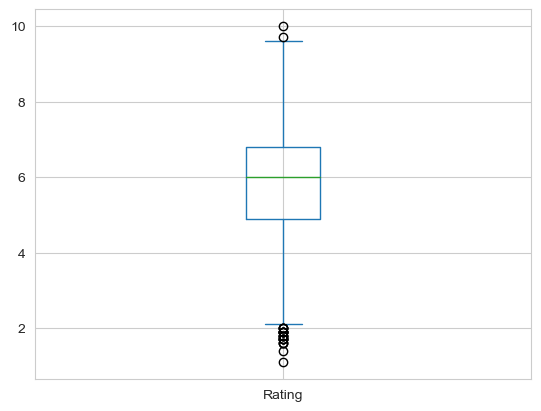

In [22]:
df['Rating'].plot(kind='box')

<Axes: >

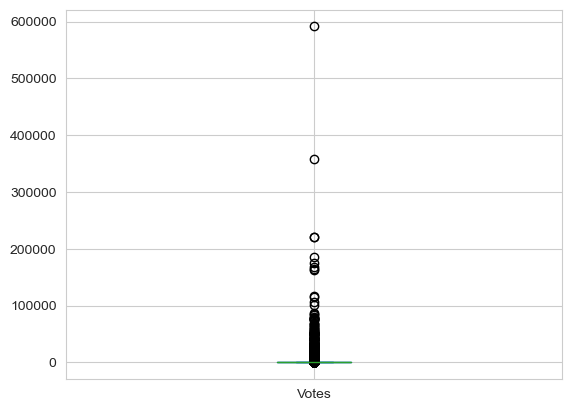

In [23]:
df['Votes'].plot(kind='box')

In [24]:
worst = df.sort_values("Votes", ascending=False).dropna().tail(10)[[ "Name", "Year", "Duration", "Votes", "Director","Actor 1"]].reset_index(drop=True)
top = df.sort_values("Votes", ascending=False).head(10)[[ "Name", "Year", "Duration", "Votes", "Director","Actor 1"]].reset_index(drop=True)

worst

,Name,Year,Duration,Votes,Director,Actor 1
0,Jai Mahakali,1951.0,162.0,5.0,Dhirubhai Desai,Nirupa Roy
1,Mounto,1975.0,114.0,5.0,Jambulingam,Navin Nischol
2,Qatil Chudail,2001.0,96.0,5.0,Kanti Shah,Anil Nagrath
3,Night Club,1958.0,137.0,5.0,Naresh Saigal,Ashok Kumar
4,Gyara Hazar Ladkian,1962.0,152.0,5.0,Khwaja Ahmad Abbas,Mala Sinha
5,Manchala,1999.0,137.0,5.0,Jayprakkash Shaw,Vivek Mushran
6,Majaz: Ae Gham-e-Dil Kya Karun,2017.0,178.0,5.0,Ravindra Singh,Priyanshu Chatterjee
7,Mashaal,1950.0,136.0,5.0,Nitin Bose,Ashok Kumar
8,Naami Chor,1977.0,127.0,5.0,Manmohan Desai,Kamal Mehra
9,Lorni - The Flaneur,2019.0,107.0,5.0,Wanphrang Diengdoh,Poonam Agarwal


In [25]:
top

,Name,Year,Duration,Votes,Director,Actor 1
0,Life of Pi,2012.0,127.0,591417.0,Ang Lee,Suraj Sharma
1,3 Idiots,2009.0,170.0,357889.0,Rajkumar Hirani,Aamir Khan
2,Lion,2016.0,118.0,220526.0,Garth Davis,Dev Patel
3,Gandhi,1982.0,191.0,220118.0,Richard Attenborough,Ben Kingsley
4,The Darjeeling Limited,2007.0,91.0,185127.0,Wes Anderson,Owen Wilson
5,Like Stars on Earth,2007.0,165.0,175810.0,Aamir Khan,Amole Gupte
6,PK,2014.0,153.0,168150.0,Rajkumar Hirani,Aamir Khan
7,Dangal,2016.0,161.0,165074.0,Nitesh Tiwari,Aamir Khan
8,Radhe,2021.0,135.0,162455.0,Prabhu Deva,Salman Khan
9,Dil Bechara,2020.0,101.0,117377.0,Mukesh Chhabra,Sushant Singh Rajput


TypeError: 'float' object cannot be interpreted as an integer

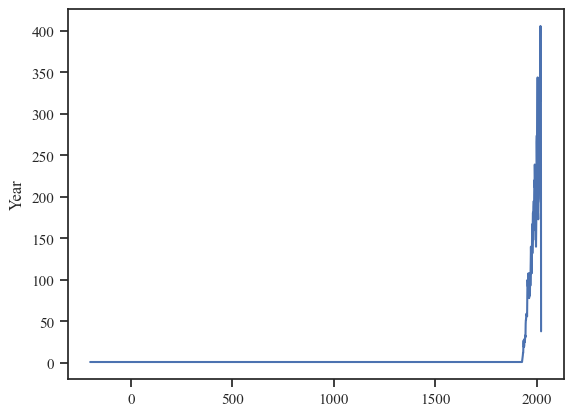

In [26]:
import seaborn as sb
import plotly.express as px
import matplotlib.pyplot as mpl
from wordcloud import WordCloud

sb.set(style = "ticks", font = "Times New Roman")

ax = sb.lineplot(data=df['Year'].value_counts().sort_index())
tick_positions = range(min(df['Year']), max(df['Year']) + 1, 5)
ax.set_title("Annual Movie Release Counts Over Time")
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_positions, rotation = 90)
ax.set_xlabel("Years")
ax.set_ylabel("Count")
mpl.show()

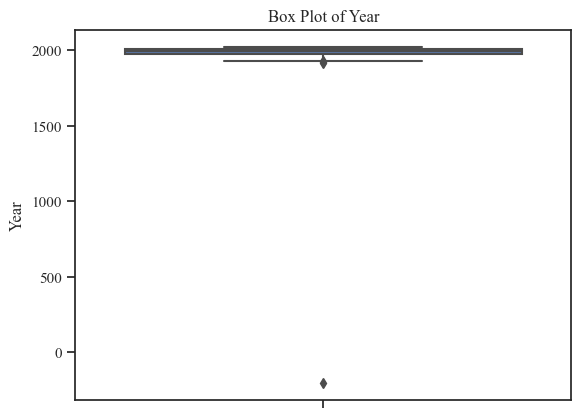

In [27]:
ax = sb.boxplot(data=df, y='Year')
ax.set_ylabel('Year')
ax.set_title('Box Plot of Year')
mpl.show()

TypeError: 'float' object cannot be interpreted as an integer

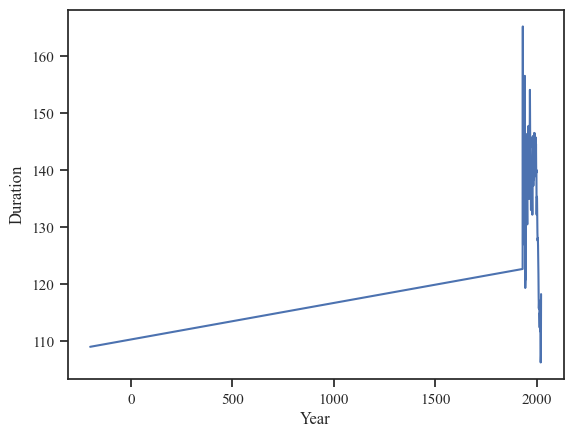

In [28]:
ax = sb.lineplot(data=df.groupby('Year')['Duration'].mean().reset_index(), x='Year', y='Duration')
tick_positions = range(min(df['Year']), max(df['Year']) + 1, 5)
ax.set_title("Average Movie Duration Trends Over the Years")
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_positions, rotation = 90)
ax.set_xlabel("Years")
ax.set_ylabel('Average Duration(in minutes)')
mpl.show()

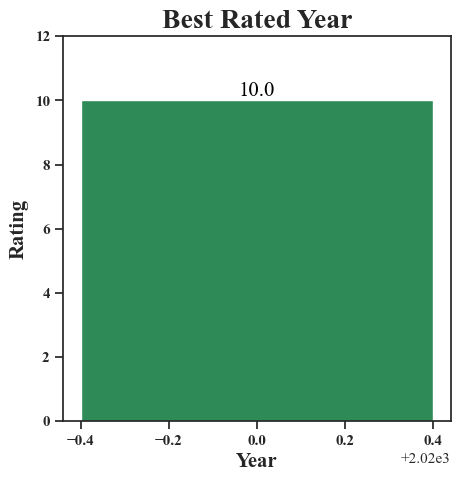

In [29]:
#sorting the Year and Rating by Rating then selecting the top one
best_rating=df[['Year','Rating']].sort_values(by='Rating',ascending=False).head(1)


#Plotting Bar Graph
fig=plt.figure(figsize=(5,5))
bars=plt.bar(x='Year',height='Rating',data=best_rating,color='seagreen')

plt.xlabel("Year",fontsize=15,fontweight='bold')
plt.ylabel("Rating",fontsize=15,fontweight='bold')
plt.title("Best Rated Year",fontsize=20,fontweight='bold')

plt.xticks(fontweight='bold',rotation=0)
plt.yticks(np.arange(0,13,2),fontweight='bold')


#Plotting the labels for Bars for better visualization
for ele in bars:
    plt.text(ele.get_x()+(ele.get_width()/2),ele.get_y()+ele.get_height(),ele.get_height(),color='black',ha='center',
             va='bottom',fontsize=15)

In [30]:
year_count = df['Year'].value_counts().reset_index()
year_count.columns = ['Year', 'Count']
fig = px.bar(year_count, x='Year', y='Count', text='Count', title='Number of Movies Released by Year')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    xaxis=dict(title='Year of Movie Release', titlefont_size=16),
    yaxis=dict(title='Count of Movies Released', titlefont_size=16, tickfont_size=14)
)
fig.show()

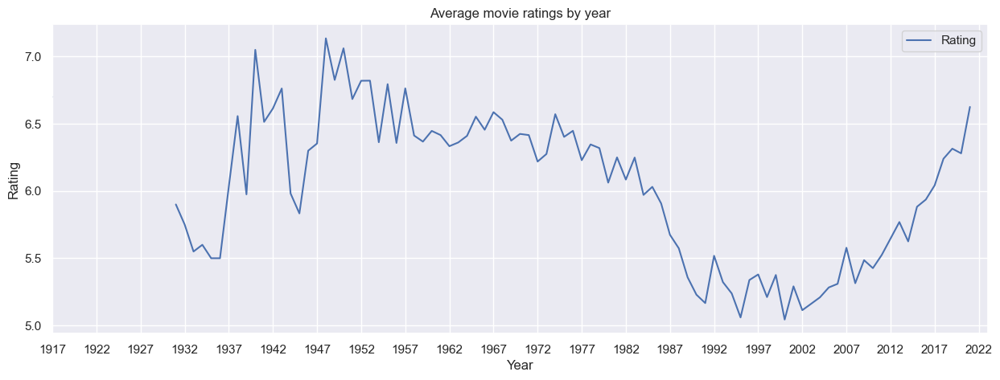

In [31]:
sns.set_style('darkgrid')
df.groupby('Year')[['Rating']].mean().plot(figsize=(15,5))
plt.xlabel('Year')
plt.ylabel('Rating')
plt.title('Average movie ratings by year')
plt.xticks(np.arange(1917,2023,5))
plt.xlim(1917,2023)
plt.show()

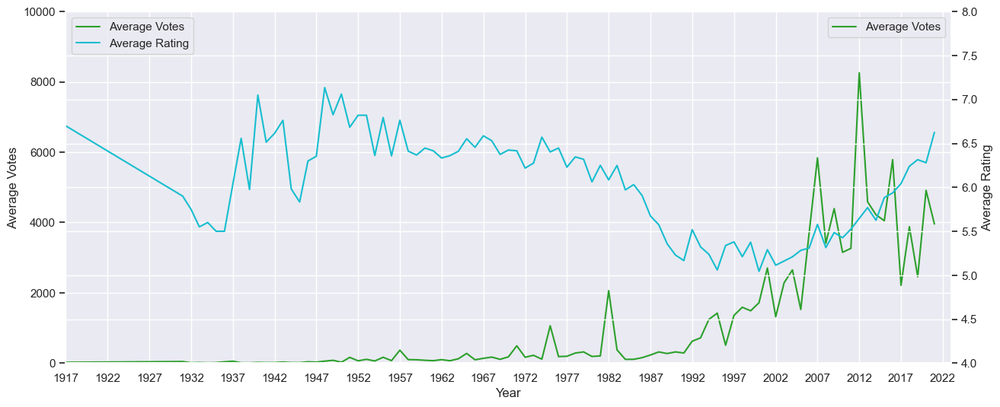

In [32]:
fig,ax1 = plt.subplots(figsize=(15,6))
sns.lineplot(data=df,x='Year',y='Votes',errorbar=None,ax=ax1,label='Average Votes',color='#2ca02c')
ax1.set_xlabel('Year')
ax1.set_ylabel('Average Votes')
ax1.set_xlim(1917,2023)
ax1.set_ylim(0,10000)
ax1.set_xticks(np.arange(1917,2023,5))
ax2 = ax1.twinx()
sns.lineplot(data=df,x='Year',y='Rating',errorbar=None,ax=ax2,color='#17becf',label='Average Rating')
ax2.set_ylabel('Average Rating')
ax2.set_ylim(4,8)
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')
plt.show()

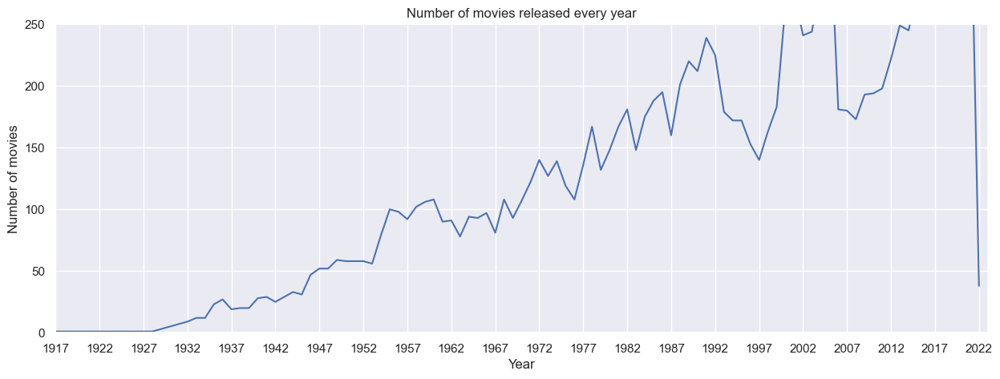

In [33]:
sns.set_style('darkgrid')
df.groupby(['Year'])['Name'].count().plot(figsize=(15,5))
plt.xlabel('Year')
plt.ylabel('Number of movies')
plt.title('Number of movies released every year')
plt.ylim(0,250)
plt.xlim(1917,2023)
plt.xticks(np.arange(1917,2023,5))
plt.show()

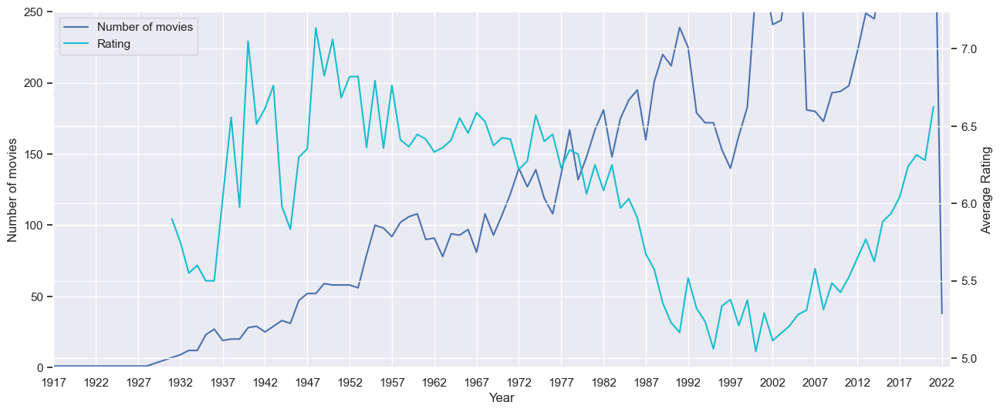

In [34]:
sns.set_style('darkgrid')
fig,ax1 = plt.subplots(figsize=(15,6))
df.groupby(['Year'])['Name'].count().plot(ax=ax1,label='Number of movies')
ax1.set_xlabel('Year')
ax1.set_ylabel('Number of movies')
ax1.set_ylim(0,250)
ax1.set_xlim(1917,2023)
ax1.set_xticks(np.arange(1917,2023,5))
ax2=ax1.twinx()
df.groupby('Year')[['Rating']].mean().plot(ax=ax2,color='#17becf',label='Average rating')
ax2.set_ylabel('Average Rating')
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')
plt.show()

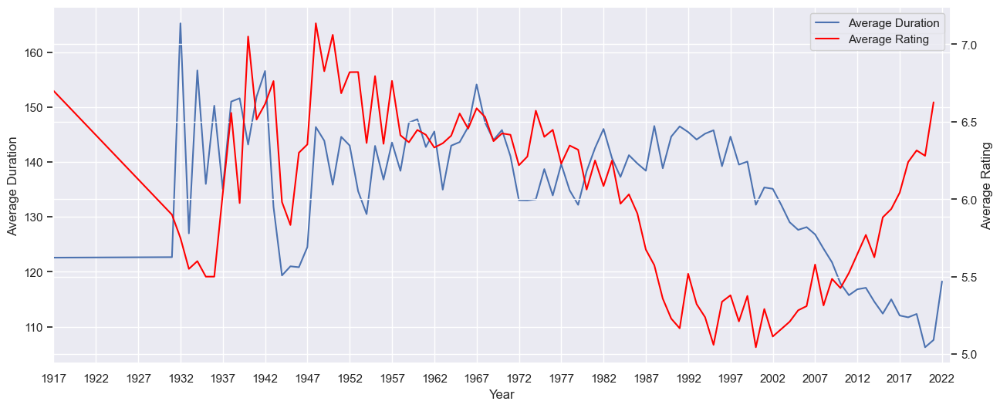

In [35]:
fig,ax1 = plt.subplots(figsize=(15,6))
sns.lineplot(data=df,x='Year',y='Duration',errorbar=None,ax=ax1,label='Average Duration')
ax1.set_xlabel('Year')
ax1.set_ylabel('Average Duration')
ax1.set_xlim(1917,2023)
ax1.set_xticks(np.arange(1917,2023,5))
ax2 = ax1.twinx()
sns.lineplot(data=df,x='Year',y='Rating',errorbar=None,ax=ax2,color='red',label='Average Rating')
ax2.set_ylabel('Average Rating')
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper right')
plt.show()

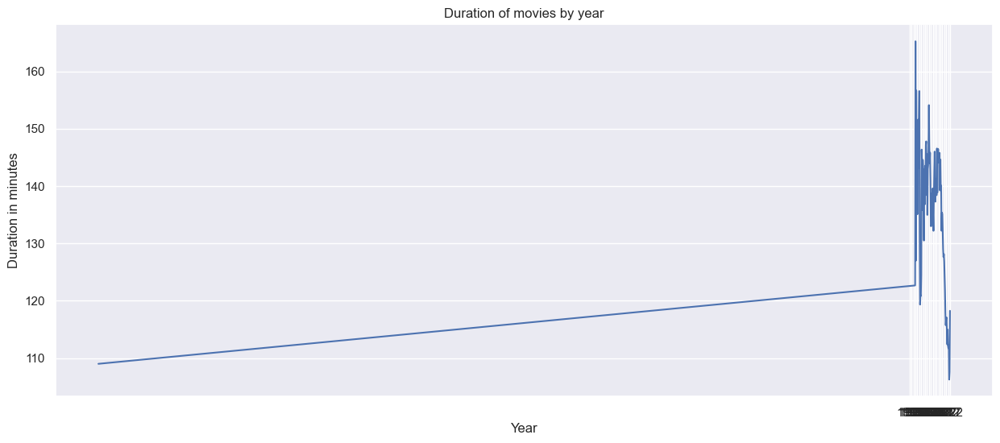

In [36]:
sns.set_style('darkgrid')
plt.figure(figsize=(15, 6))
sns.lineplot(data=df,x='Year',y='Duration',errorbar=None)
plt.xlabel('Year')
plt.ylabel('Duration in minutes')
plt.title('Duration of movies by year')
plt.xticks(np.arange(1917,2023,5))
plt.show()

<Axes: xlabel='Year', ylabel='Rating'>

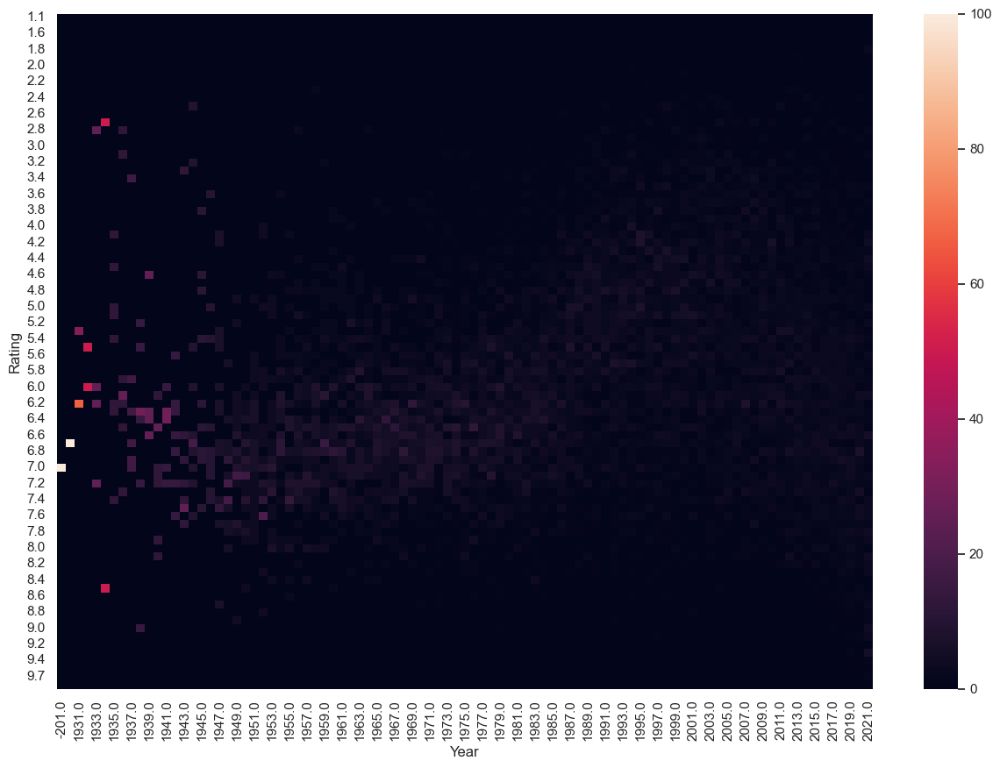

In [37]:
plt.figure(figsize=(15,10))
sns.heatmap(pd.crosstab(df['Rating'], df['Year'], normalize='columns') * 100)

In [38]:
def TopTenPlot(column):
    global df
    df[column].value_counts().sort_values(ascending=False)[:10].plot(kind="bar", figsize=(20,6), edgecolor="k")
    plt.xticks(rotation=0)
    plt.title("Top Ten {}".format(column))
    plt.xlabel(column)
    plt.ylabel("Count")
    plt.show()

def Histogram(column):
    global df
    plt.figure(figsize=(20,6))
    plt.hist(df[column], edgecolor="k")
    plt.xticks(rotation=0)
    plt.title("Histogram of {}".format(column))
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()

def Scatter(x, y, c=None):
    global df
    plt.figure(figsize=(20,6))
    plt.scatter(df[x], df[y], edgecolor="k", c=c)
    plt.xticks(rotation=0)
    plt.title("Scatter plot X:{} / Y:{}".format(x, y))
    plt.xlabel(x)
    plt.ylabel(y)
    plt.show()   

In [39]:
# Top Directors Analysis
director_df = df[['Director', 'Year']].dropna()
director_df['Movie_Count'] = 1

# Get the top 20 directors by movie count
top_20_directors = director_df['Director'].value_counts().head(20).index.tolist()
top_20_director_df = director_df[director_df['Director'].isin(top_20_directors)]
fig = px.strip(top_20_director_df, x='Year', y='Director', color='Director', title='Top 20 Directors by Number of Movies Made Over the Years')
fig.update_layout(
    xaxis_tickfont_size=14,
    height=600
)
fig.show()

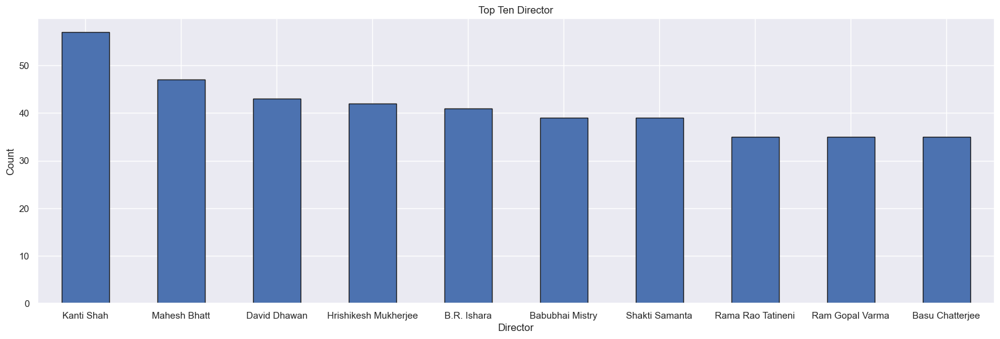

In [40]:
TopTenPlot("Director")

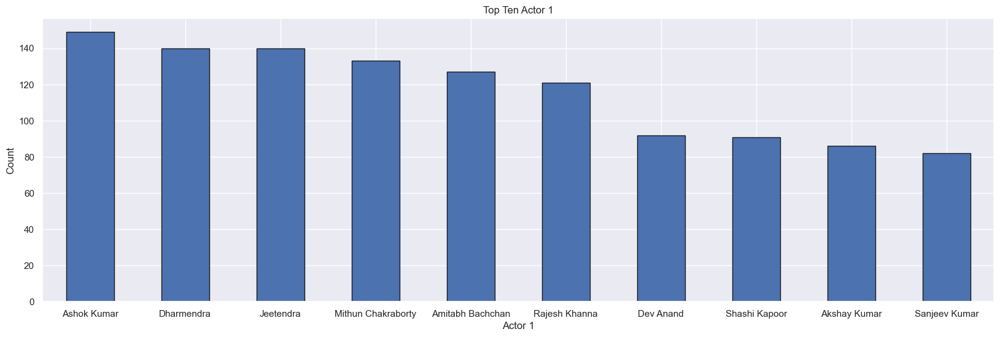

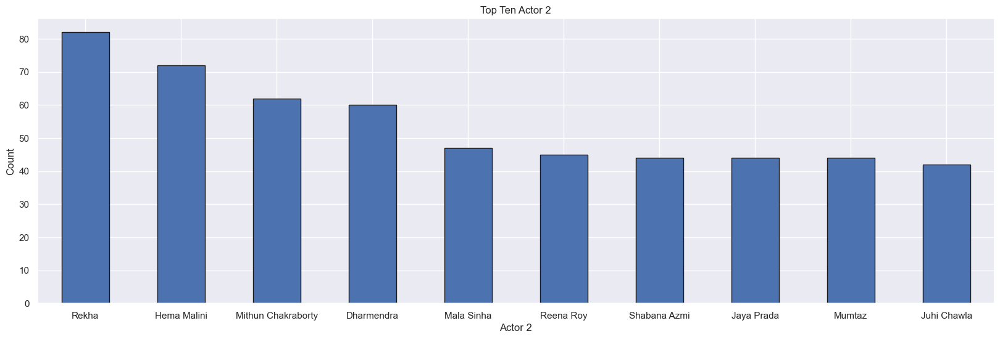

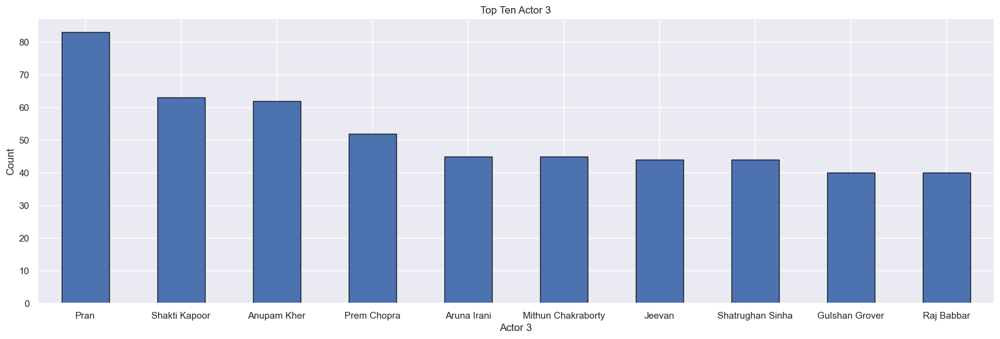

In [41]:
TopTenPlot("Actor 1")
TopTenPlot("Actor 2")
TopTenPlot("Actor 3")

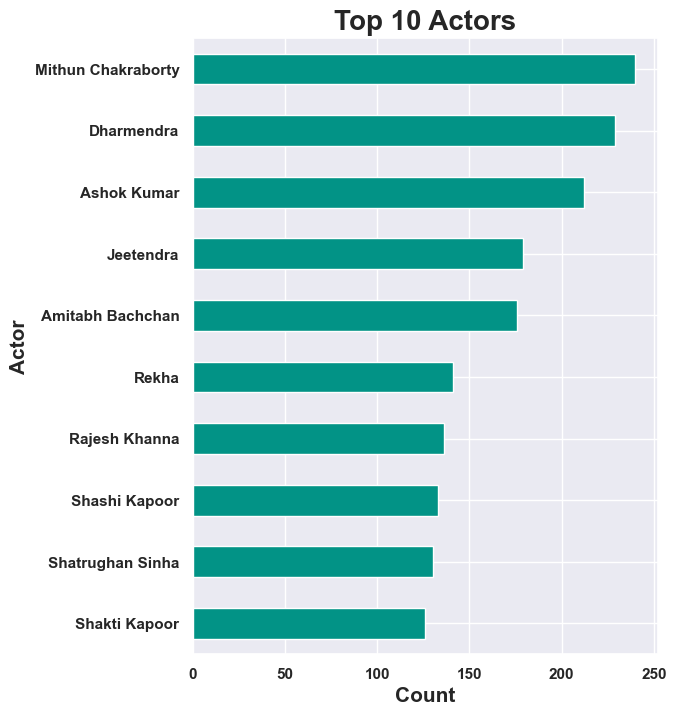

In [42]:
#Making Series for the all the columns of Actors
Actor1=df['Actor 1']
Actor2=df['Actor 2']
Actor3=df['Actor 3']

#Concatinating the series in one series
Actors = pd.concat([Actor1,Actor2,Actor3])

#sorting series by counts then selecting top 10
frequent_actor=Actors.value_counts().sort_values(ascending=False).head(10)

#Plotting Bar graph
frequent_actor.sort_values().plot(kind='barh',color='#029386',figsize=(6,8))

plt.title('Top 10 Actors',fontweight='bold',fontsize=20)
plt.xlabel('Count',fontweight='bold',fontsize=15)
plt.ylabel('Actor',fontweight='bold',fontsize=15)
plt.xticks(fontweight='bold')
plt.yticks(fontweight='bold')
plt.show()

In [43]:
# Actor analysis
actor_cols = ['Actor 1', 'Actor 2', 'Actor 3']
actor_df = pd.melt(df[['Year'] + actor_cols], id_vars=['Year'], value_vars=actor_cols, var_name='Actor', value_name='Movie_Count')
actor_df.dropna(subset=['Actor'], inplace=True)
top_20_actors = actor_df['Actor'].value_counts().head(20).index.tolist()
top_20_actor_df = actor_df[actor_df['Actor'].isin(top_20_actors)]
fig = px.strip(top_20_actor_df, x='Year', y='Actor', color='Actor', title='Top 20 Actors by Number of Movies Made Over the Years')
fig.update_layout(
    xaxis_tickfont_size=14,
    height=600
)
fig.show()

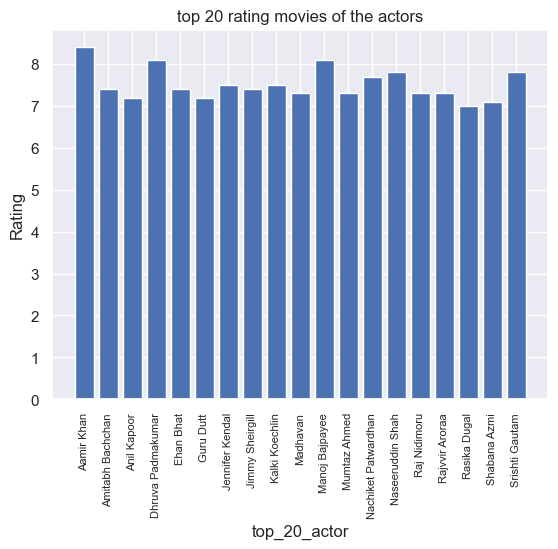

In [44]:
top_20_rates_movies_of_actor=df[(df['Rating']>=7)]['Actor 1'].head(20)
top_20_actor=df.groupby(top_20_rates_movies_of_actor)['Rating'].mean()
plt.bar(top_20_actor.index,top_20_actor.values)
plt.xlabel("top_20_actor")
plt.ylabel("Rating")
plt.title("top 20 rating movies of the actors")
plt.xticks(rotation='vertical', fontsize=8)
plt.show()

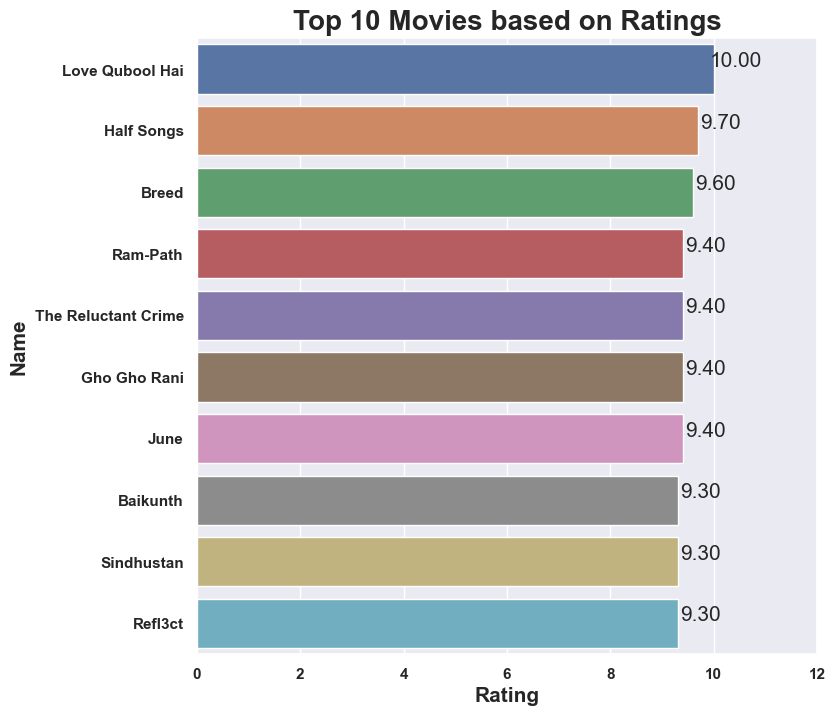

In [45]:
#intializing figure of the chart
plt.figure(figsize=(8, 8))

#Dropping the index where Year is 2022,as 2022 is in future
dframe= df.set_index('Year')

#sorting Name and Rating by Rating then selecting top 10
top_movies= dframe[['Name','Rating']].sort_values(by='Rating',ascending=False).head(10)

#Plotting Bar chart
plots = sns.barplot(x="Rating", y="Name", data=top_movies)
  

#Plotting Labels for bars
for bar in plots.patches:
    
    plots.annotate(format(bar.get_width(),'.2f'), 
                   (bar.get_x() + bar.get_width()+0.3, 
                    bar.get_y()+0.5), ha='center', va='center',
                   size=15, xytext=(5,10),
                   textcoords='offset points')
    plt.xlabel("Rating",fontsize=15,fontweight='bold')
plt.ylabel("Name",fontsize=15,fontweight='bold')
plt.title("Top 10 Movies based on Ratings",fontsize=20,fontweight='bold')

plt.xticks(np.arange(0,13,2),fontweight='bold')
plt.yticks(fontweight='bold')
plt.show()

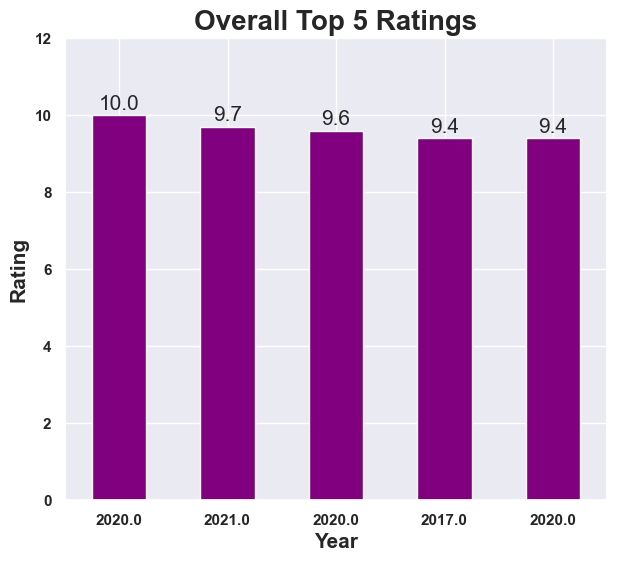

In [46]:
#sorting Values of Year and Rating by Rating then selecting top 5
top5_rating=df[['Year','Rating']].sort_values(by='Rating',ascending=False).head()

#Plotting Bar Graph
bars=top5_rating.plot(kind='bar',x='Year',y='Rating',color='purple',legend=None,figsize=(7,6))

plt.xlabel("Year",fontsize=15,fontweight='bold')
plt.ylabel("Rating",fontsize=15,fontweight='bold')
plt.title("Overall Top 5 Ratings",fontsize=20,fontweight='bold')

plt.xticks(fontweight='bold',rotation=0)
plt.yticks(np.arange(0,13,2),fontweight='bold')


#Plotting Labels for bars
for bar in bars.patches:
    bars.annotate(format(bar.get_height(),'.1f'), 
                   (bar.get_x() + bar.get_width() / 2, 
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')

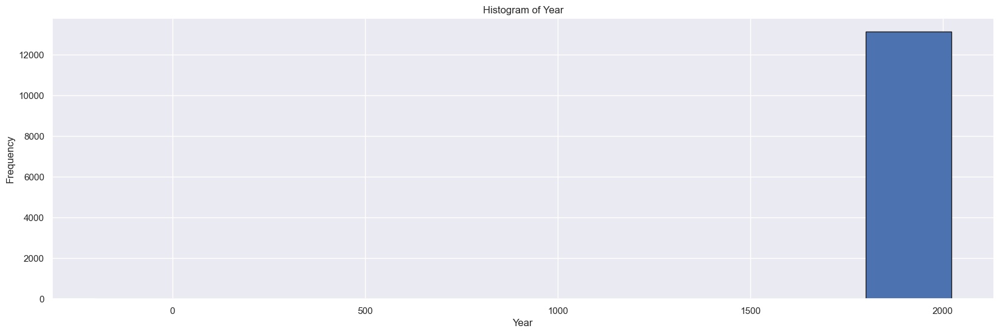

In [47]:
Histogram("Year")

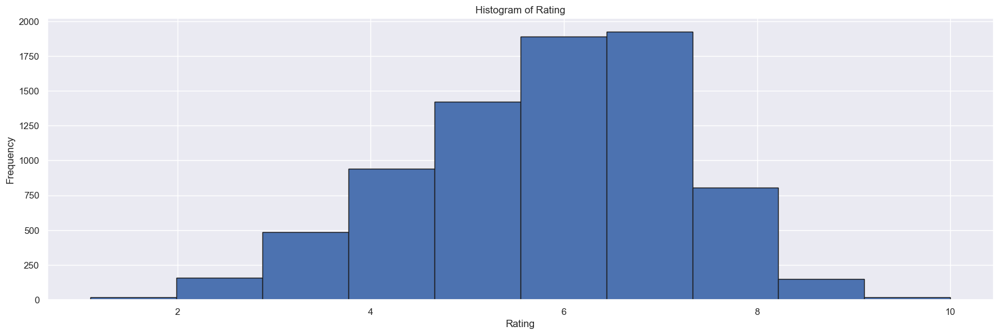

In [48]:
Histogram("Rating")

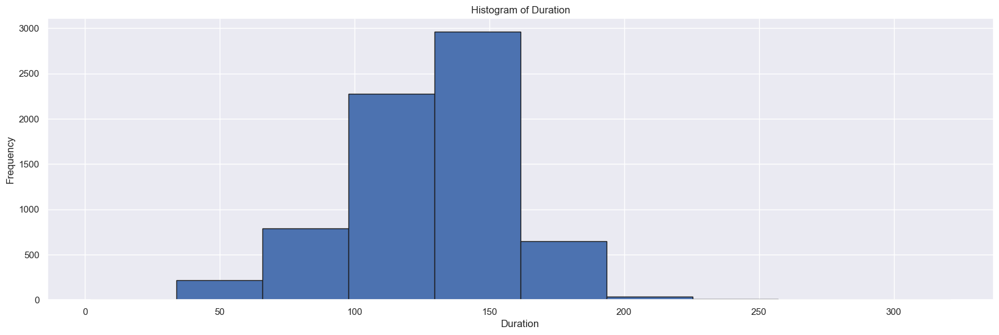

In [49]:
Histogram("Duration")

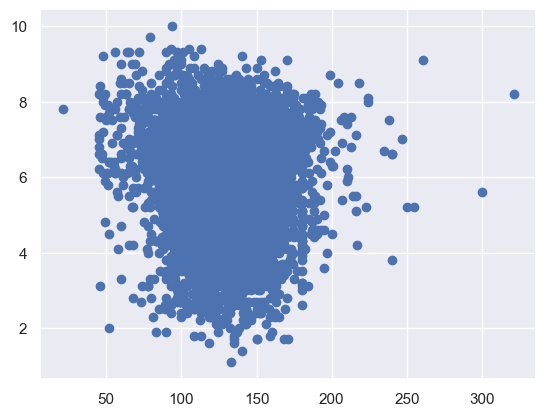

In [50]:
plt.scatter(df['Duration'],df['Rating'])
plt.show()

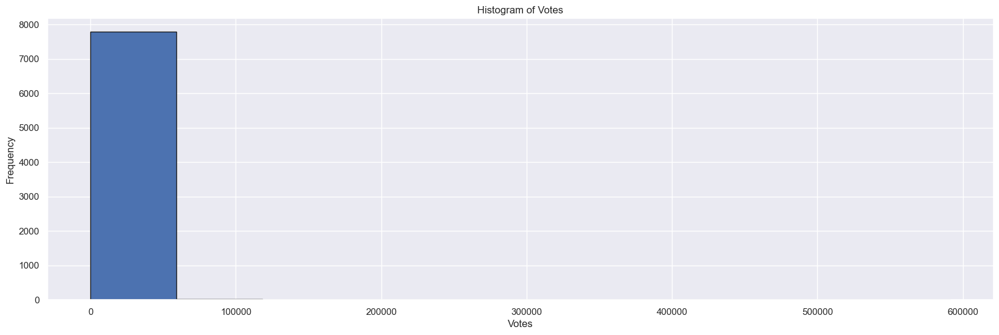

In [51]:
Histogram("Votes")

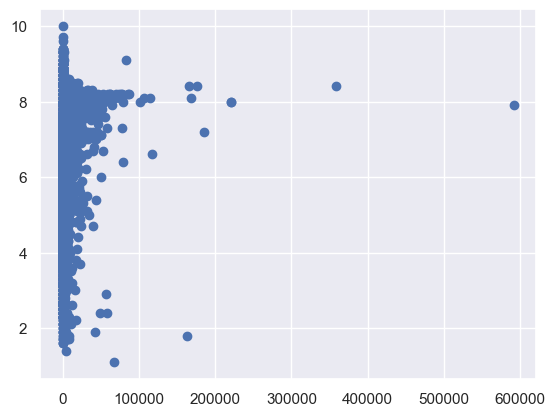

In [52]:
plt.scatter(df["Votes"],df["Rating"])
plt.show()

<Axes: xlabel='Votes', ylabel='Density'>

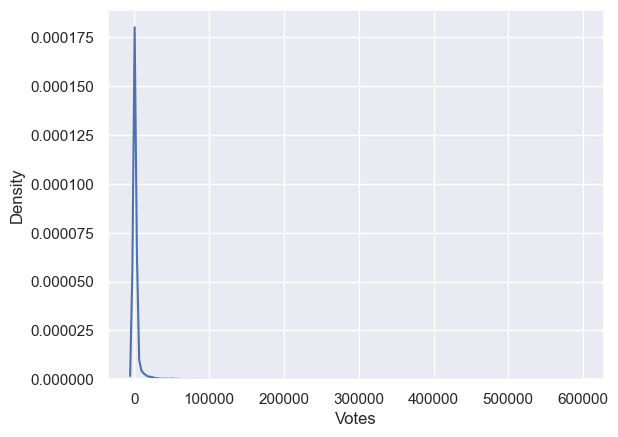

In [53]:
sns.distplot(a=df.Votes, hist=False)

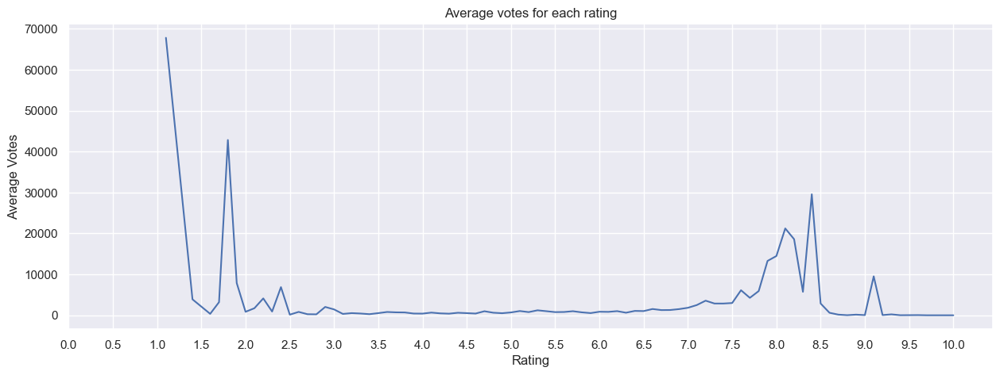

In [54]:
sns.set_style('darkgrid')
plt.figure(figsize=(15,5))
sns.lineplot(data=df,x='Rating',y='Votes',errorbar=None)
plt.xlabel('Rating')
plt.ylabel('Average Votes')
plt.xticks(np.arange(0,10.5,0.5))
plt.title('Average votes for each rating')
plt.show()

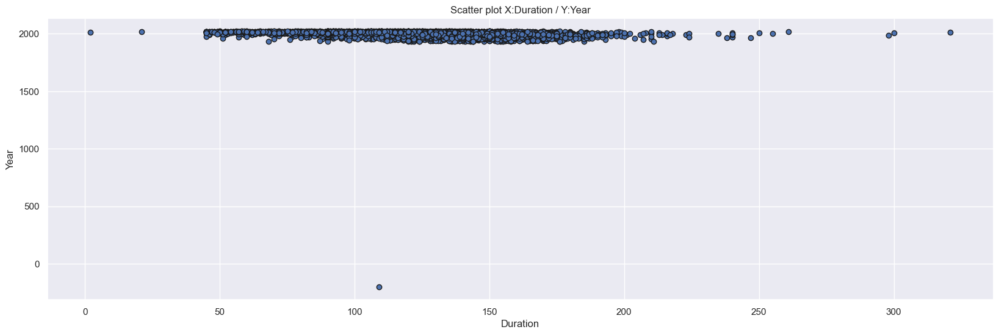

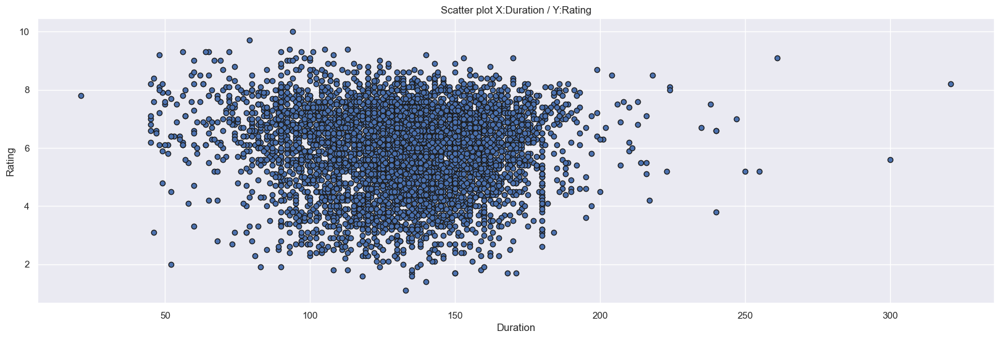

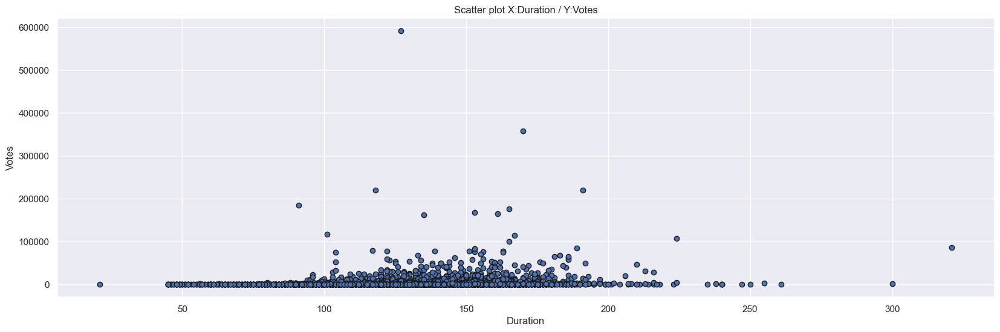

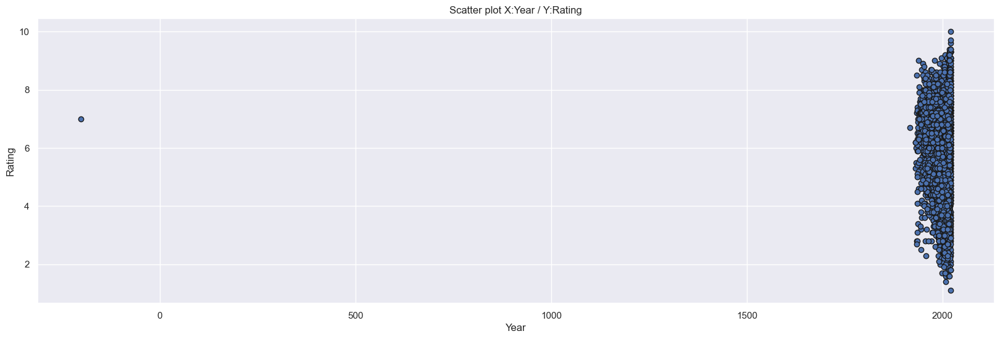

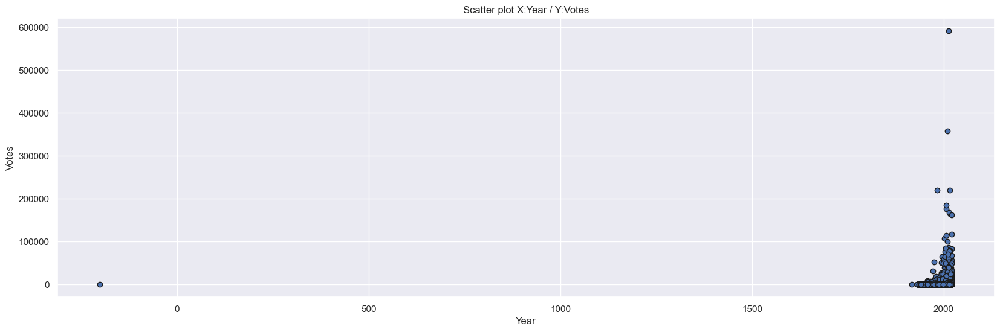

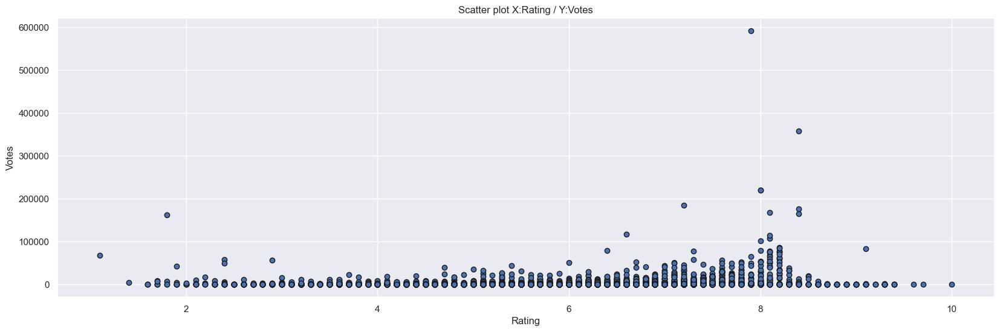

In [55]:
from itertools import combinations
 
comb = combinations(["Duration", "Year", "Rating", "Votes"], 2)
comb_list = []
for i in list(comb):
    comb_list.append(list(i))
    
for col in comb_list:
    Scatter(col[0], col[1])

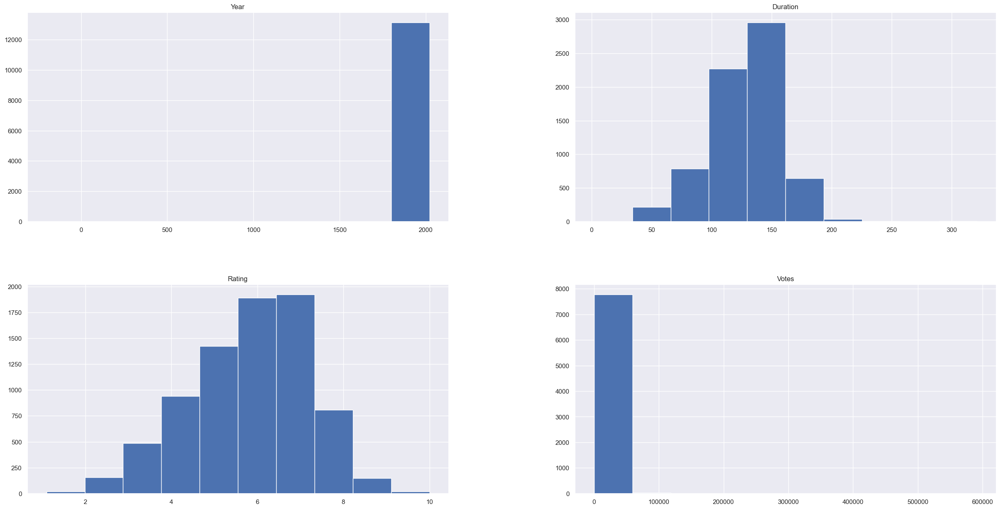

In [56]:
df.hist(figsize=(30, 15))
None

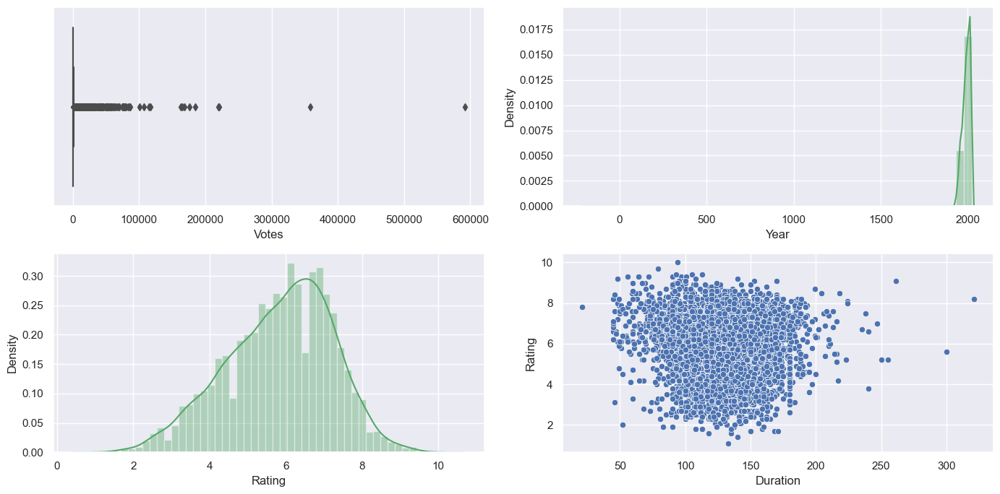

In [57]:
plt.figure(figsize=(14,7))
plt.subplot(2,2,1)
sns.boxplot(x='Votes',data=df)

plt.subplot(2,2,2)
sns.distplot(df['Year'],color='g')

plt.subplot(2,2,3)
sns.distplot(df['Rating'],color='g')

plt.subplot(2,2,4)
sns.scatterplot(x=df['Duration'], y=df['Rating'], data=df)

plt.tight_layout()
plt.show()

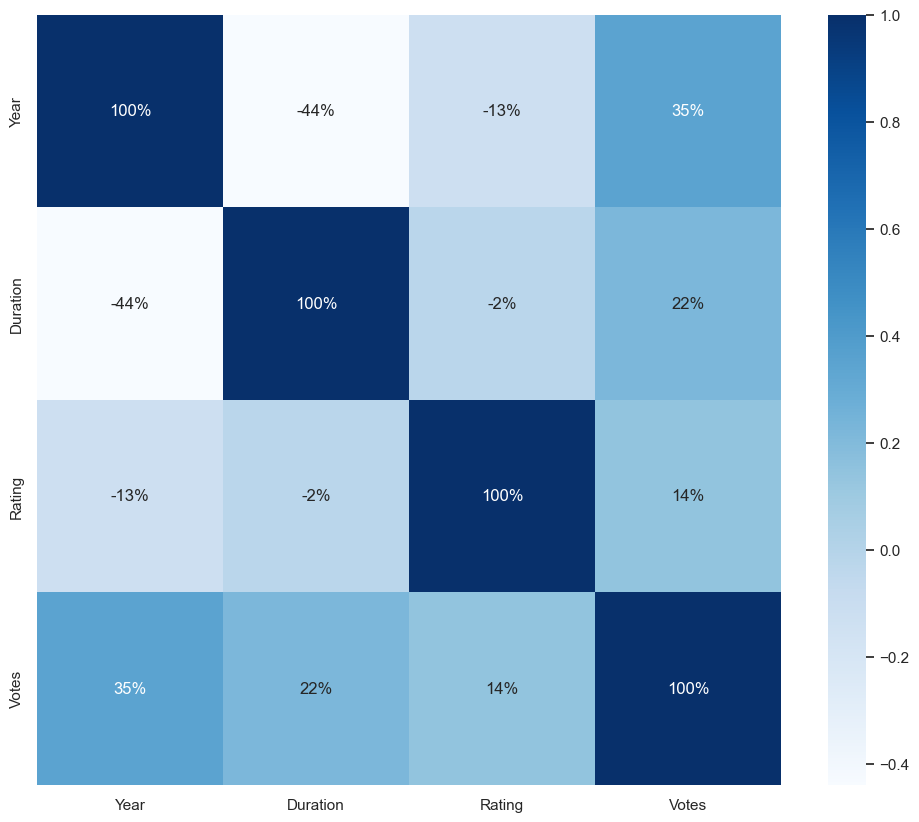

In [58]:
plt.figure(figsize=(12,10))
sns.heatmap(df.corr(method='spearman'),annot=True,cmap="Blues", fmt='.0%')
plt.show()

In [59]:
dur_rat = df[['Duration', 'Rating', 'Votes']].dropna()
fig = px.scatter_3d(dur_rat, x='Duration', y='Rating', z='Votes', color='Rating', title='3D Plot of Duration, Rating, and Votes')
fig.show()

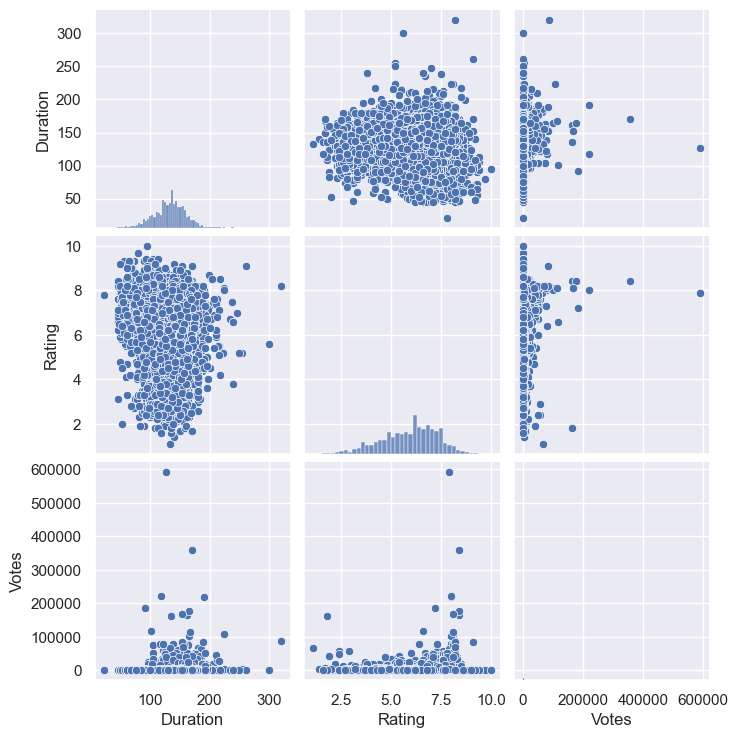

In [60]:
sns.pairplot(dur_rat)
plt.show()

<Axes: xlabel='Duration', ylabel='Rating'>

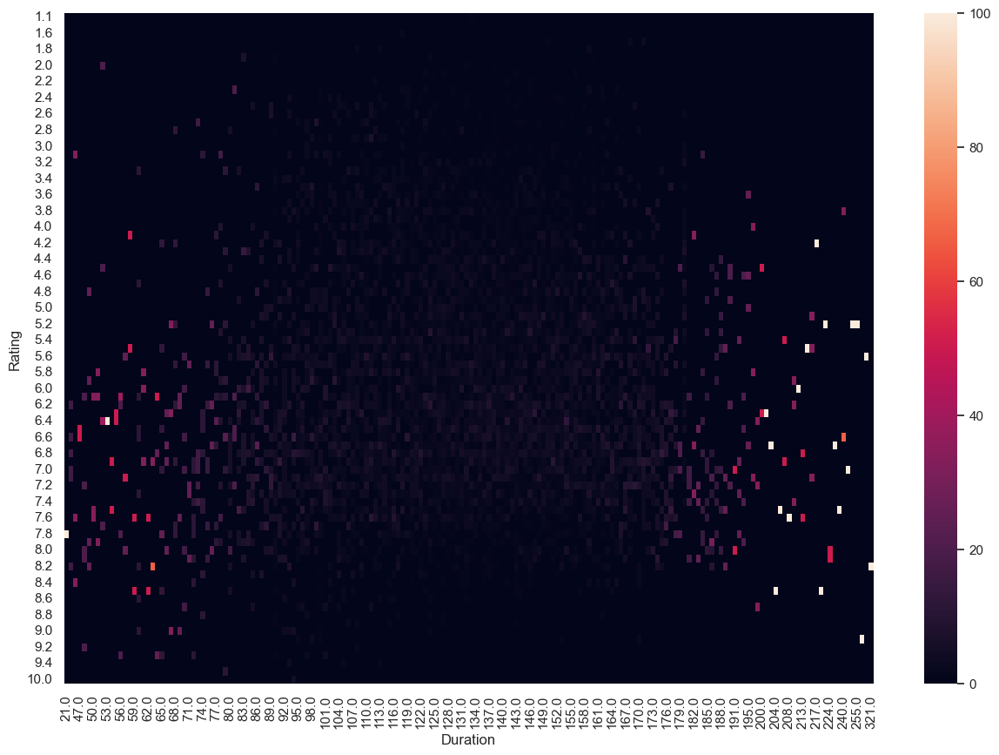

In [61]:
plt.figure(figsize=(15,10))
sns.heatmap(pd.crosstab(df['Rating'], df['Duration'], normalize='columns') * 100)

In [62]:
#Importing Counter to count distinct values form perticular series
from collections import Counter

#creating series for Genre column
Genre=dframe['Genre']

#initializing counter object
Genre_counter=Counter()

#splitting the values if one row contain more than two values
for response in Genre:
    Genre_counter.update(response.split(','))
    
#Printing the top 10 values with occured most of the time
print(Genre_counter.most_common(10))

#Creating List to store the Counter values
Genres=[]
frequency=[]

for items in Genre_counter.most_common(10):
    Genres.append(items[0])
    frequency.append(items[1])

    
#As Drama Appears more than twice in the List
Genres.pop(2)
frequency.pop(2)
#this will not affect the data as Drama will remain on top whether we add them or remove them 

[('Drama', 4357), ('Action', 3425), (' Drama', 2677), (' Romance', 1660), ('Comedy', 1494), (' Thriller', 881), (' Crime', 852), (' Family', 776), ('Romance', 741), ('Thriller', 740)]


2677

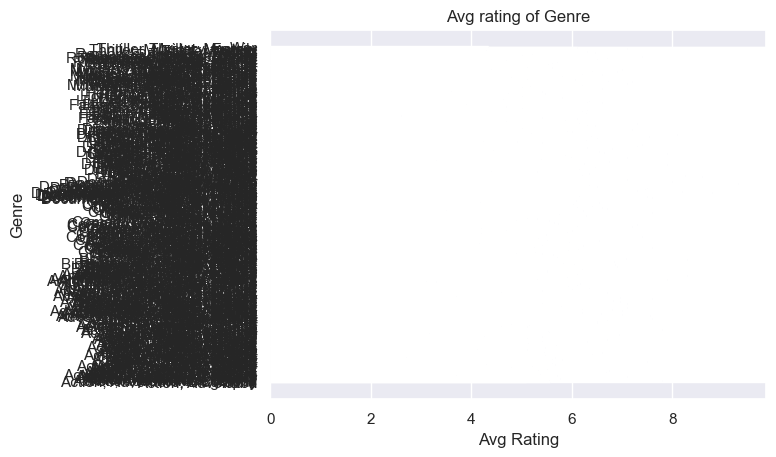

In [63]:
# Genre Analysis
avg_ratings=df.groupby('Genre')['Rating'].mean()
plt.barh(avg_ratings.index,avg_ratings.values)
plt.xlabel("Avg Rating")
plt.ylabel("Genre")
plt.title("Avg rating of Genre")
plt.show()

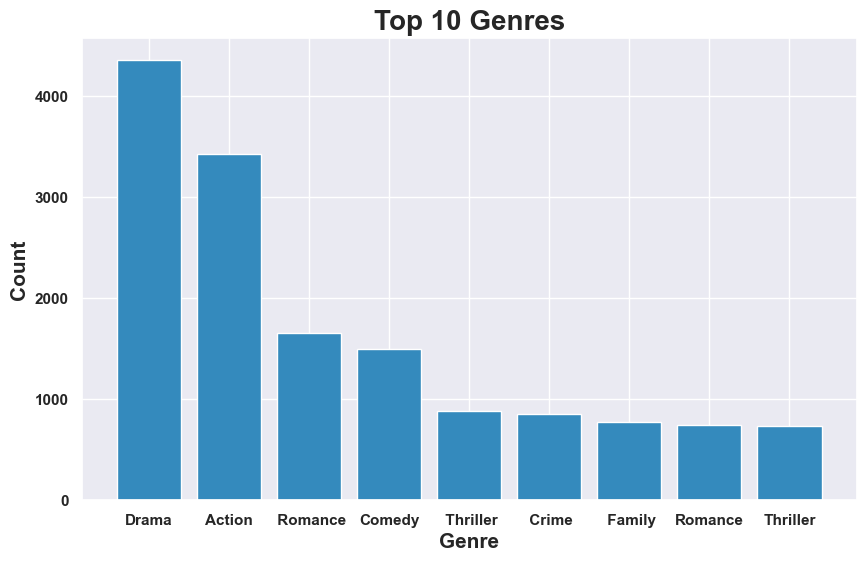

In [64]:
#Plotting bar graph
fig= plt.figure(figsize=(10,6))
plt.bar(Genres,frequency,color='#348ABD')
plt.title('Top 10 Genres',fontweight='bold',fontsize=20)
plt.xlabel('Genre',fontweight='bold',fontsize=15)
plt.ylabel('Count',fontweight='bold',fontsize=15)
plt.xticks(fontweight='bold',rotation=0)
plt.yticks(fontweight='bold')
plt.show()

<Axes: ylabel='Frequency'>

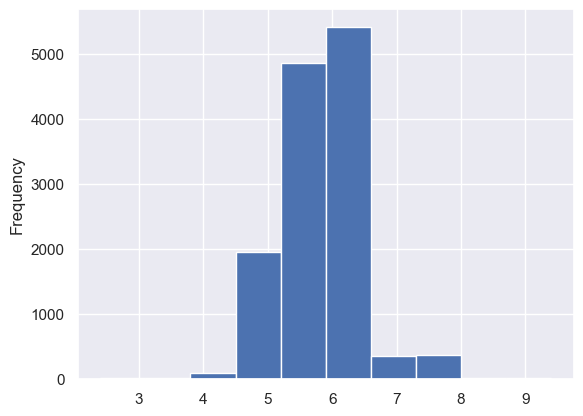

In [65]:
genre_counts = df['Genre'].value_counts()
df['Genre_encoded'] = df['Genre'].map(genre_counts)

genre_mean_rating = df.groupby('Genre')['Rating'].transform('mean')
df['Genre_mean_rating'] = genre_mean_rating

director_mean_rating = df.groupby('Director')['Rating'].transform('mean')
df['Director_encoded'] = director_mean_rating

actor_mean_rating = df.groupby('Actor 1')['Rating'].transform('mean')
df['Actor_encoded'] = actor_mean_rating

df['Genre_mean_rating'].plot(kind='hist')

In [66]:
dummies = df['Genre'].str.get_dummies(', ')
df_genre = pd.concat([df, dummies], axis=1)

# Plot genre trends over the years
genre_columns = df_genre.columns[10:]  # Assuming genre columns start from the 11th column
genre_count_by_year = df_genre.groupby('Year')[genre_columns].sum().reset_index()

fig = go.Figure()
for genre in genre_columns:
    fig.add_trace(go.Scatter(x=genre_count_by_year['Year'], y=genre_count_by_year[genre],
                             mode='lines', name=genre))

fig.update_layout(
    title='Genre Trends Over the Years',
    xaxis=dict(title='Year', titlefont_size=16),
    yaxis=dict(title='Count', titlefont_size=16, tickfont_size=14),
    legend=dict(y=0, x=1.0, bgcolor='rgba(255, 255, 255, 0)', bordercolor='rgba(255, 255, 255, 0)')
)
fig.show()

<Axes: xlabel='Genre', ylabel='Rating'>

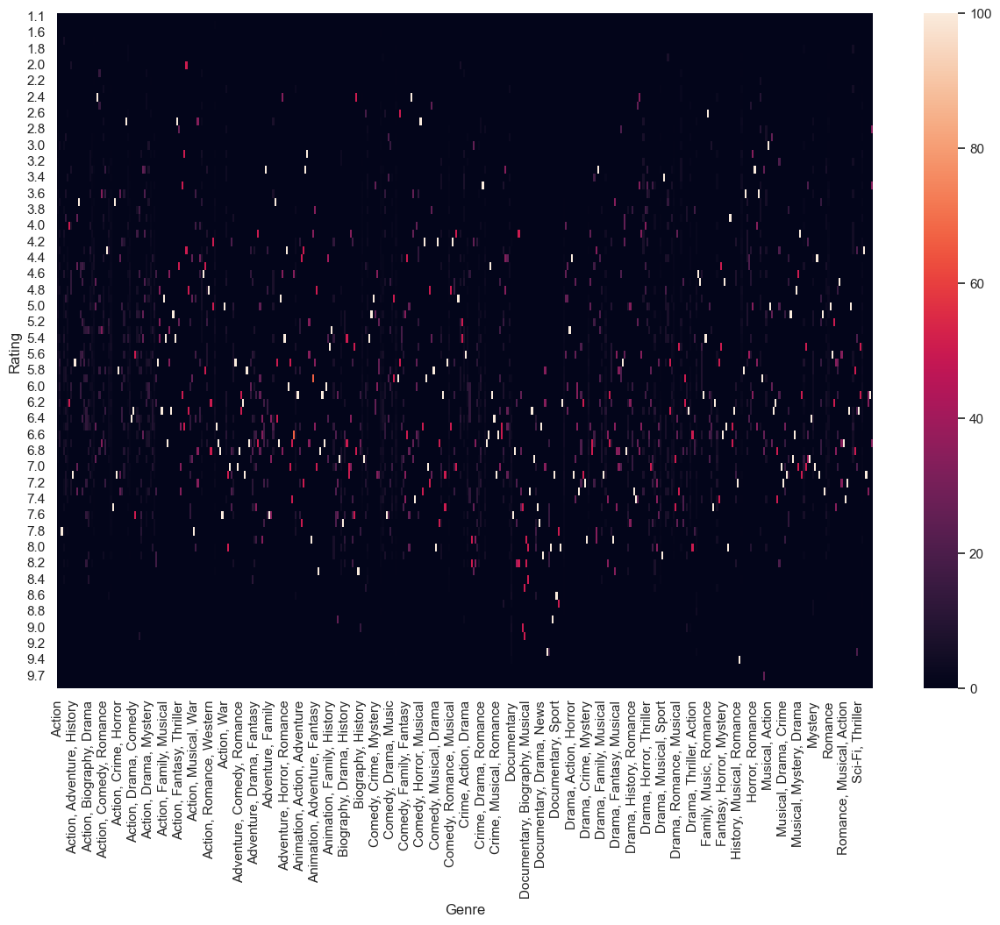

In [67]:
plt.figure(figsize=(15,10))
sns.heatmap(pd.crosstab(df['Rating'], df['Genre'], normalize='columns') * 100)

Text(0.5, 1.0, 'Number of Movies Per Year')

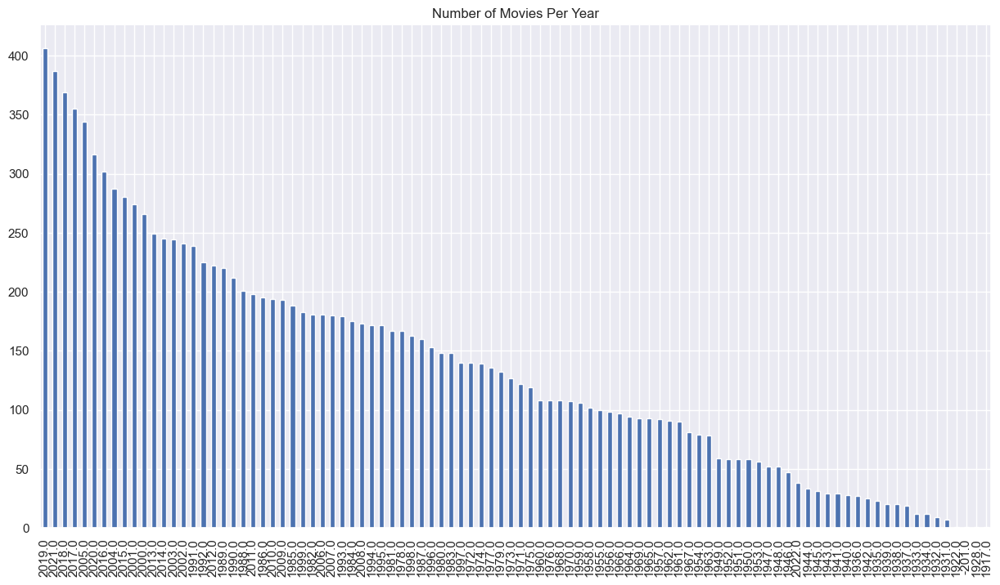

In [68]:
plt.figure(figsize=(15,8))
df['Year'].value_counts().plot(kind='bar')
plt.title('Number of Movies Per Year')

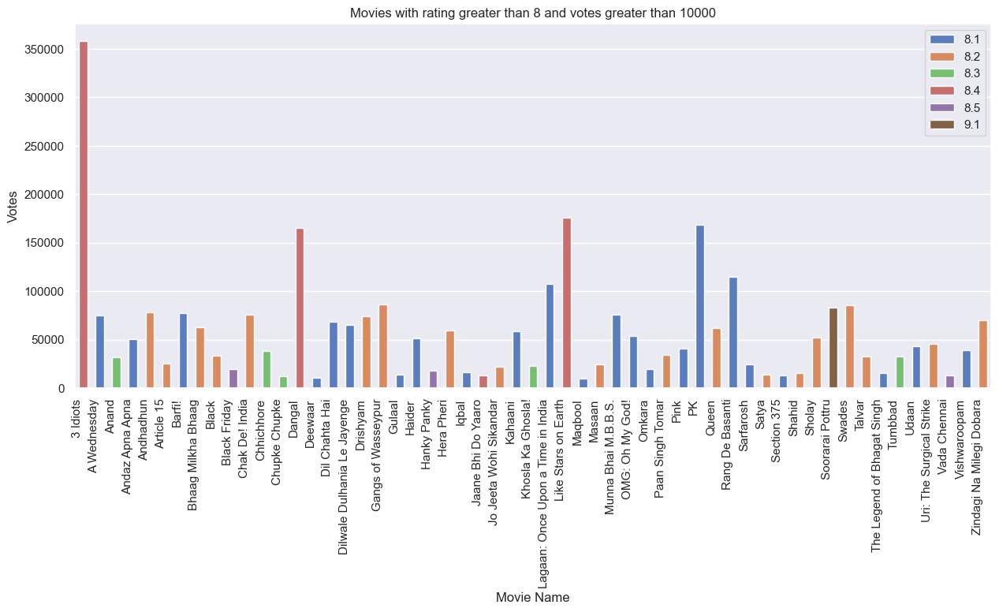

In [69]:
sns.set_style('darkgrid')
d = df.loc[(df['Rating']>8) & (df['Votes']>10000), ['Rating','Votes','Name']]
plt.figure(figsize=(15, 6))
ax=sns.barplot(data=d,x='Name',y='Votes',hue='Rating',dodge=False,width=0.5,palette='muted')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')
ax.legend(loc='upper right')
ax.set_xlabel('Movie Name')
ax.set_ylabel('Votes')
ax.set_title('Movies with rating greater than 8 and votes greater than 10000')
plt.show()

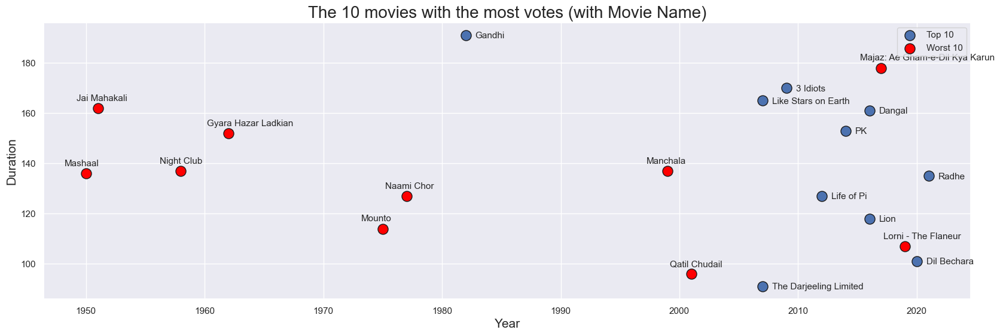

In [70]:
plt.figure(figsize=(20,6),dpi=100)
plt.scatter(top["Year"], top["Duration"], edgecolor="k",s=150, label="Top 10")
for i in range(10):
    plt.text(x=top["Year"][i]+0.8,y=top["Duration"][i]-1.2,s=top["Name"][i], fontsize=11, rotation =0)
plt.scatter(worst["Year"], worst["Duration"], color="red",s=150, label="Worst 10", edgecolor="k")
for i in range(10):
    plt.text(x=worst["Year"][i]-1.8,y=worst["Duration"][i]+3,s=worst["Name"][i], fontsize=11, rotation =0)
plt.legend()
plt.title("The 10 movies with the most votes (with Movie Name)", fontsize=20)
plt.xlabel("Year", fontsize=15)
plt.ylabel("Duration", fontsize=15)
plt.xticks(rotation=0)

plt.show()

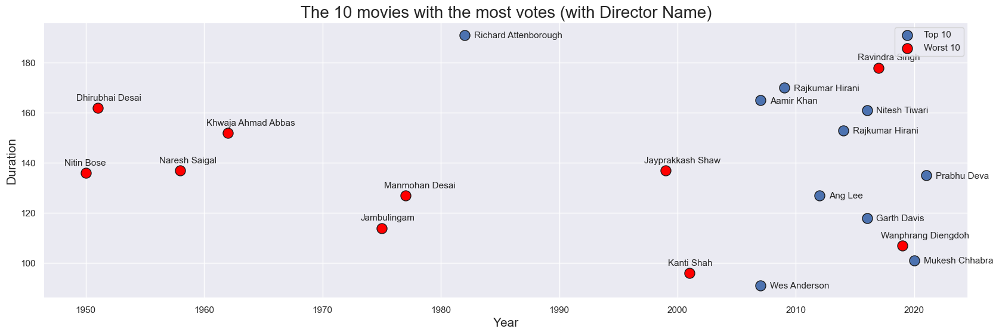

In [71]:
plt.figure(figsize=(20,6),dpi=100)
plt.scatter(top["Year"], top["Duration"], edgecolor="k",s=150, label="Top 10")
for i in range(10):
    plt.text(x=top["Year"][i]+0.8,y=top["Duration"][i]-1.2,s=top["Director"][i], fontsize=11, rotation =0)
plt.scatter(worst["Year"], worst["Duration"], color="red",s=150, label="Worst 10", edgecolor="k")
for i in range(10):
    plt.text(x=worst["Year"][i]-1.8,y=worst["Duration"][i]+3,s=worst["Director"][i], fontsize=11, rotation =0)
plt.legend()
plt.title("The 10 movies with the most votes (with Director Name)", fontsize=20)
plt.xlabel("Year", fontsize=15)
plt.ylabel("Duration", fontsize=15)
plt.xticks(rotation=0)
plt.show()

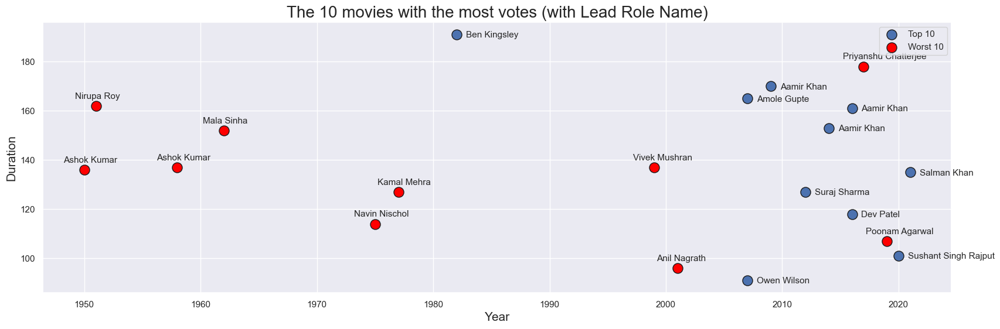

In [72]:
plt.figure(figsize=(20,6),dpi=100)
plt.scatter(top["Year"], top["Duration"], edgecolor="k",s=150, label="Top 10")
for i in range(10):
    plt.text(x=top["Year"][i]+0.8,y=top["Duration"][i]-1.2,s=top["Actor 1"][i], fontsize=11, rotation =0)
plt.scatter(worst["Year"], worst["Duration"], color="red",s=150, label="Worst 10", edgecolor="k")
for i in range(10):
    plt.text(x=worst["Year"][i]-1.8,y=worst["Duration"][i]+3,s=worst["Actor 1"][i], fontsize=11, rotation =0)
plt.legend()
plt.title("The 10 movies with the most votes (with Lead Role Name)", fontsize=20)
plt.xlabel("Year", fontsize=15)
plt.ylabel("Duration", fontsize=15)
plt.xticks(rotation=0)
plt.show() 

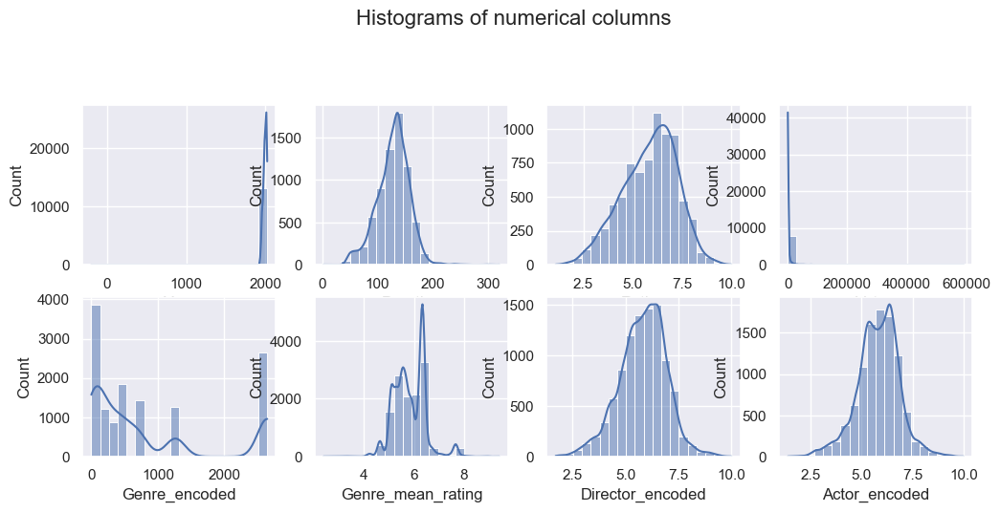

In [73]:
num_columns = list(df.select_dtypes(include=np.number).columns)
num=int(len(num_columns)/2) if int(len(num_columns)/2)>1 else 2
fig ,ax = plt.subplots(num,num,figsize=(12,10))
for j in range(num):
    for i in range(num):
        try:
            sns.histplot(data=df,x=num_columns[0],kde=True,bins=20,ax=ax[j][i])
            num_columns.pop(0)
        except:
            fig.delaxes(ax=ax[j][i])
fig.suptitle('Histograms of numerical columns', fontsize=16)
plt.show()

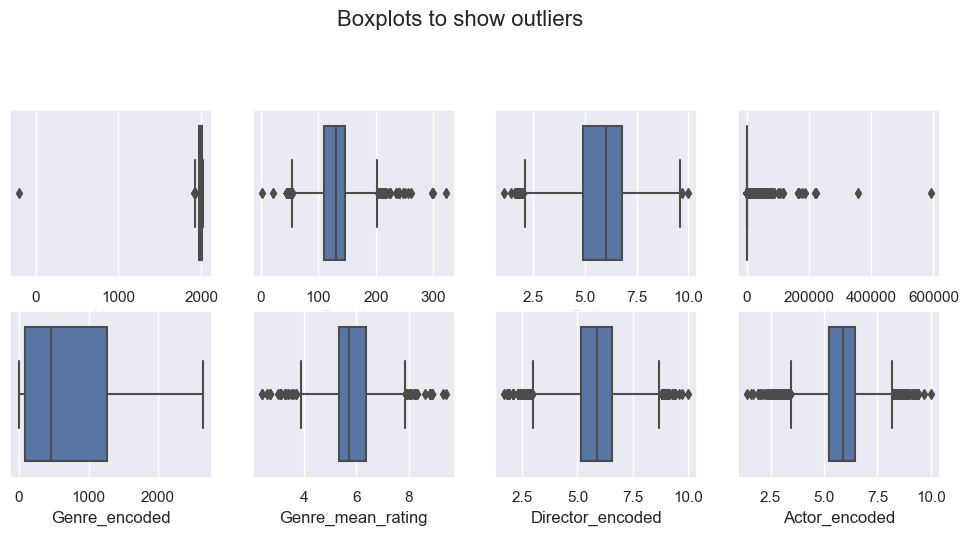

In [74]:
num_columns = list(df.select_dtypes(include=np.number).columns)
num=int(len(num_columns)/2) if int(len(num_columns)/2)>1 else 2
fig ,ax = plt.subplots(num,num,figsize=(12,10))
for j in range(num):
    for i in range(num):
        try:
            sns.boxplot(data=df,x=num_columns[0],ax=ax[j][i])
            num_columns.pop(0)
        except:
            fig.delaxes(ax=ax[j][i])
fig.suptitle('Boxplots to show outliers', fontsize=16)
plt.show()

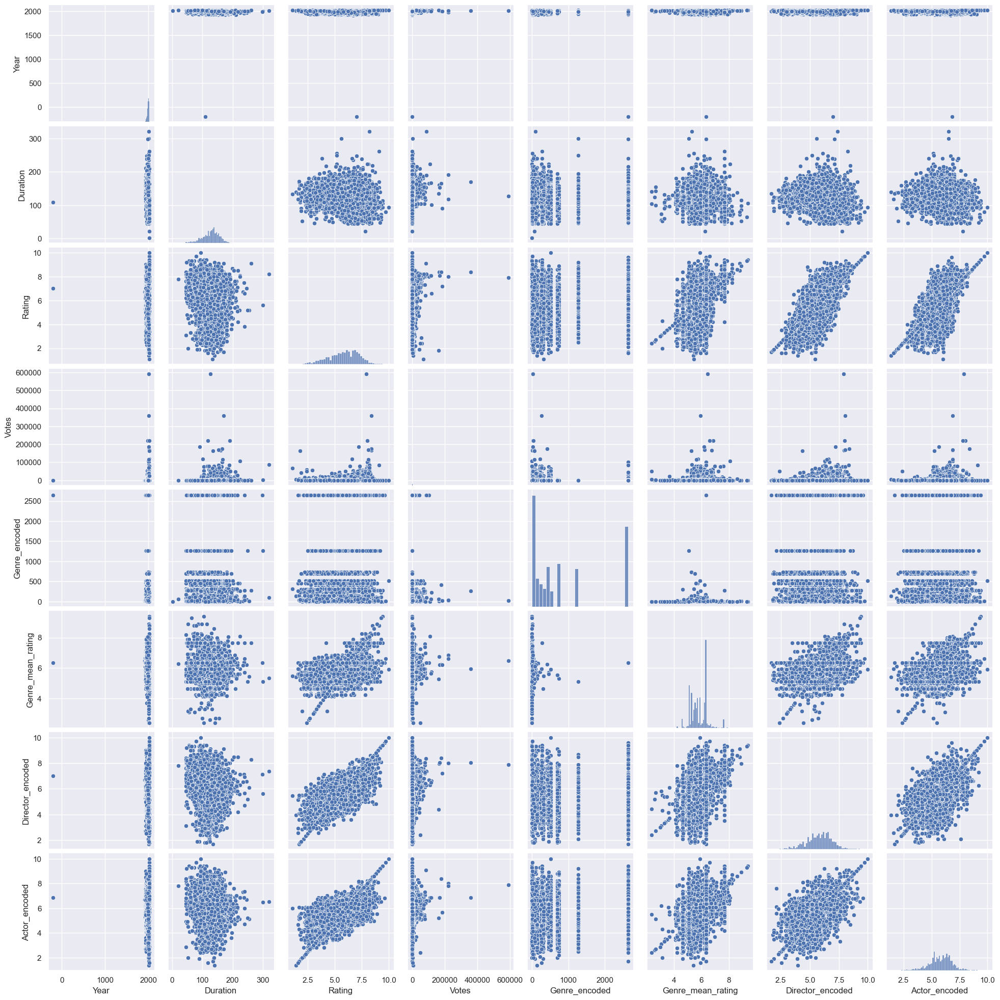

In [75]:
sns.pairplot(df)
plt.show()

In [76]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

In [77]:
labels = df[['Year']]
features = df[['Year']]

In [78]:
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

In [79]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [80]:
# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
print(f"Root Mean Squared Error: {rmse}")

Root Mean Squared Error: 2.938416704691785e-14


In [81]:
print('Mean squared error: ',mean_squared_error(y_test,y_pred))
print('Mean absolute error: ',mean_absolute_error(y_test,y_pred))
print('R2 score: ',r2_score(y_test,y_pred))

Mean squared error:  8.634292730411728e-28
Mean absolute error:  5.731927700956668e-16
R2 score:  1.0


In [82]:
# print(scores)
from sklearn.model_selection import cross_val_score
from sklearn import svm
scores = cross_val_score(model,labels,features, cv=5)
print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

1.00 accuracy with a standard deviation of 0.00


In [83]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import SGDRegressor
from sklearn.preprocessing import StandardScaler
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('sgd', SGDRegressor(max_iter=10000, random_state=1000))
])

In [84]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd', SGDRegressor(max_iter=10000, random_state=1000))])

In [85]:
# Model evaluation
y_pred_pipeline = pipeline.predict(X_test)

# Evaluation Metrics for the Pipeline
mae_pipeline = mean_absolute_error(y_test, y_pred_pipeline)
mse_pipeline = mean_squared_error(y_test, y_pred_pipeline)
r2_pipeline = r2_score(y_test, y_pred_pipeline)

print("Pipeline Mean Absolute Error:", mae_pipeline)
print("Pipeline Mean Squared Error:", mse_pipeline)
print("Pipeline R-squared:", r2_pipeline)

Pipeline Mean Absolute Error: 0.001869644258786737
Pipeline Mean Squared Error: 2.264400635059748e-05
Pipeline R-squared: 0.9999999901289149


In [86]:
# Model Deployment
new_input = pd.DataFrame({
    'Year': [2023],       
})
# Use the trained pipeline to make predictions on the input
predicted_rating = pipeline.predict(new_input)

print("Predicted Rating:", predicted_rating)

Predicted Rating: [2022.99693638]


In [87]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Define the models
models = {
    'RandomForestRegressor': RandomForestRegressor()
}

# Define the parameters for grid search
params = {
    'RandomForestRegressor': { 'n_estimators': [75,100,125,150], 'max_features': ['sqrt', 'log2'] }

}

In [88]:
for model_name, model in models.items():
    model_to_tune = GridSearchCV(model, params[model_name], cv=5)
    model_to_tune.fit(X_train, y_train)
    
    print(f"Best parameters for {model_name}: {model_to_tune.best_params_}")
    print(f"Best score for {model_name}: {model_to_tune.best_score_}")
# So the maximum my model can reach is 99 percent

Best parameters for RandomForestRegressor: {'max_features': 'log2', 'n_estimators': 75}
Best score for RandomForestRegressor: 0.9999888084425187


In [89]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

In [90]:
from sklearn.metrics import mean_squared_error, r2_score as score
def evaluate_model(y_true, y_pred, model_name):
    print("Model: ", model_name)
    print("Accuracy = {:0.2f}%".format(score(y_true, y_pred)*100))
    print("Mean Squared Error = {:0.2f}\n".format(mean_squared_error(y_true, y_pred, squared=False)))
    return round(score(y_true, y_pred)*100, 2)

In [91]:
RFR = RandomForestRegressor(n_estimators=100, random_state=1)
RFR.fit(X_train, y_train)
rf_preds = RFR.predict(X_test)
RFScore = evaluate_model(y_test, rf_preds, "RANDOM FOREST")

DTR = DecisionTreeRegressor(random_state=1)
DTR.fit(X_train, y_train)
dt_preds = DTR.predict(X_test)
DTScore = evaluate_model(y_test, dt_preds, "DECEISION TREE")

XGBR = XGBRegressor(n_estimators=100, random_state=1)
XGBR.fit(X_train, y_train)
xgb_preds = XGBR.predict(X_test)
XGBScore = evaluate_model(y_test, xgb_preds, "EXTENDED GRADIENT BOOSTING")

GBR = GradientBoostingRegressor(n_estimators=100, random_state=60)
GBR.fit(X_train, y_train)
gb_preds = GBR.predict(X_test)
GBScore = evaluate_model(y_test, gb_preds, "GRADIENT BOOSTING")

LGBMR = LGBMRegressor(n_estimators=100, random_state=60)
LGBMR.fit(X_train, y_train)
lgbm_preds = LGBMR.predict(X_test)
LGBScore = evaluate_model(y_test, lgbm_preds, "LIGHT GRADIENT BOOSTING")

KNR = KNeighborsRegressor(n_neighbors=5)
KNR.fit(X_train, y_train)
knn_preds = KNR.predict(X_test)
KNNScore = evaluate_model(y_test, knn_preds, "K NEAREST NEIGHBORS")

Model:  RANDOM FOREST
Accuracy = 25.33%
Mean Squared Error = 41.39

Model:  DECEISION TREE
Accuracy = 25.59%
Mean Squared Error = 41.32

Model:  EXTENDED GRADIENT BOOSTING
Accuracy = 25.59%
Mean Squared Error = 41.32

Model:  GRADIENT BOOSTING
Accuracy = 25.58%
Mean Squared Error = 41.32

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 93
[LightGBM] [Info] Number of data points in the train set: 10512, number of used features: 1
[LightGBM] [Info] Start training from score 1992.156202
Model:  LIGHT GRADIENT BOOSTING
Accuracy = 24.60%
Mean Squared Error = 41.59

Model:  K NEAREST NEIGHBORS
Accuracy = 24.93%
Mean Squared Error = 41.50



In [92]:
models = pd.DataFrame(
    {
        "MODELS": [ "Random Forest", "Decision Tree", "Gradient Boosting", "Extended Gradient Boosting", "Light Gradient Boosting","K Nearest Neighbors"],
        "SCORES": [ RFScore, DTScore, GBScore, XGBScore, LGBScore, KNNScore]
    }
)
models.sort_values(by='SCORES', ascending=False)

,MODELS,SCORES
1,Decision Tree,25.59
3,Extended Gradient Boosting,25.59
2,Gradient Boosting,25.58
0,Random Forest,25.33
5,K Nearest Neighbors,24.93
4,Light Gradient Boosting,24.60
